 First, let's setup all of this...

In [1]:
import numpy as np
from pathlib import Path
import spotipy
import json
from pprint import pprint
import dill
import seaborn as sns
sns.set_style('whitegrid')

# import modin as pd
import pandas as pd
pd.set_option('max_columns', None)
from typing import Dict, List, Union

from copy import deepcopy

# User configuration file, json with specifics key
credential_fp = Path(r'private/spotify_credential.json')

# List of interesting scopes
scope = ' '.join([
    'user-library-read',
    'user-top-read',
])


In [2]:

df_toptracks = pd.read_pickle(Path(r'private/toptracks.pickle'))


 Let's retrieve the most useful column for our analysis like:
 * related to music features
 * to classify it (name, etc...)
 * release date (could be related to a specific era)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7faeec801610>,
      dtype=object)

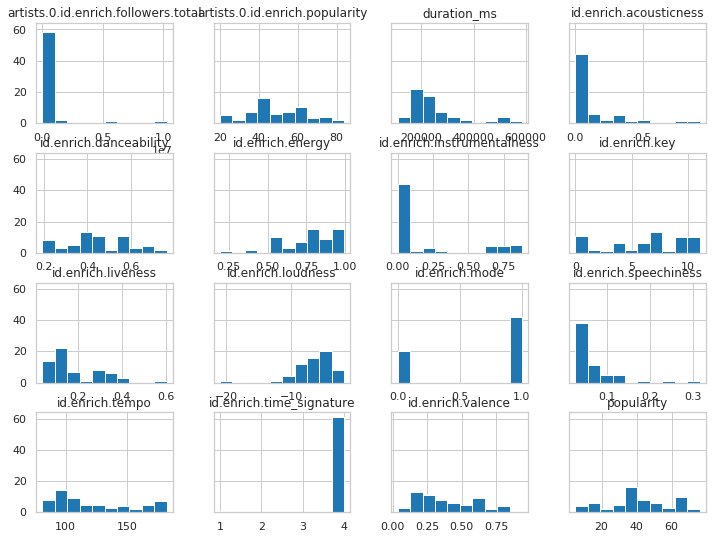

In [3]:

df:pd.DataFrame = df_toptracks[[
    'id',
    'name',
    'artists.0.id.enrich.name',
    'album.release_date',
    'artists.0.id.enrich.genres',
    'popularity',
    'duration_ms',
    'artists.0.id.enrich.popularity',
    'artists.0.id.enrich.followers.total',
    'id.enrich.danceability',
    'id.enrich.energy',
    'id.enrich.key',
    'id.enrich.loudness',
    'id.enrich.mode',
    'id.enrich.speechiness',
    'id.enrich.acousticness',
    'id.enrich.instrumentalness',
    'id.enrich.liveness',
    'id.enrich.valence',
    'id.enrich.tempo',
    'id.enrich.time_signature',
]]

df_plot:pd.DataFrame = df.drop([
    'id',
    'name',
    'artists.0.id.enrich.name',
    'album.release_date',
    'artists.0.id.enrich.genres'
], axis=1)

sns.set_context('notebook')
#%matplotlib inline
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (12, 9) # (w, h)

df_plot.hist(sharey=True)


 We will try a clustering algorithm and use the "genre" feature to check if
 the clustering succeedded or is failing totally.
 As such we will cluster with T-SNE and then do a deeper analysis of the
 "genre" feature:
 https://spotipy.readthedocs.io/en/2.9.0/#spotipy.client.Spotify.recommendation_genre_seeds
 * how many unique genre there is
 * how many unique combination of genre there is
 * what is the distribution of genre and same for its combination
 * distribution of the number of genre per sample

In [4]:

from sklearn.manifold import TSNE

tsne_pos = TSNE().fit_transform(df.drop([
    'id',
    'name',
    'artists.0.id.enrich.name',
    'album.release_date',
    'artists.0.id.enrich.genres',
    'popularity',
    'duration_ms',
    'artists.0.id.enrich.popularity',
    'artists.0.id.enrich.followers.total',
], axis=1))

df[['tsne_posx', 'tsne_posy']] = pd.DataFrame(tsne_pos)


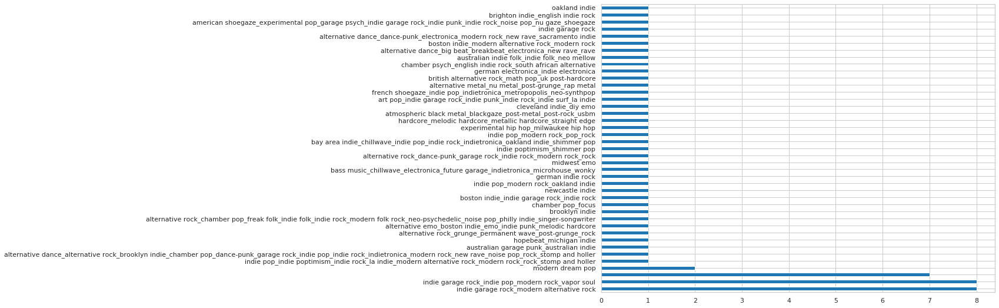

In [5]:
df['genre'] = df['artists.0.id.enrich.genres'].map(lambda x: '_'.join(x))
df.genre.value_counts().plot(kind='barh')


In [6]:
# multi-label binarizer to apply first, column length = number of unique genre
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer()
genre_bin = mlb.fit_transform(
    df['artists.0.id.enrich.genres']
)
df_genre:pd.DataFrame = pd.DataFrame(genre_bin,
                                    columns=mlb.classes_,
                                    index=df.index)\
                            .add_prefix('genre_')
df:pd.DataFrame = pd.concat([df,df_genre],axis=1)


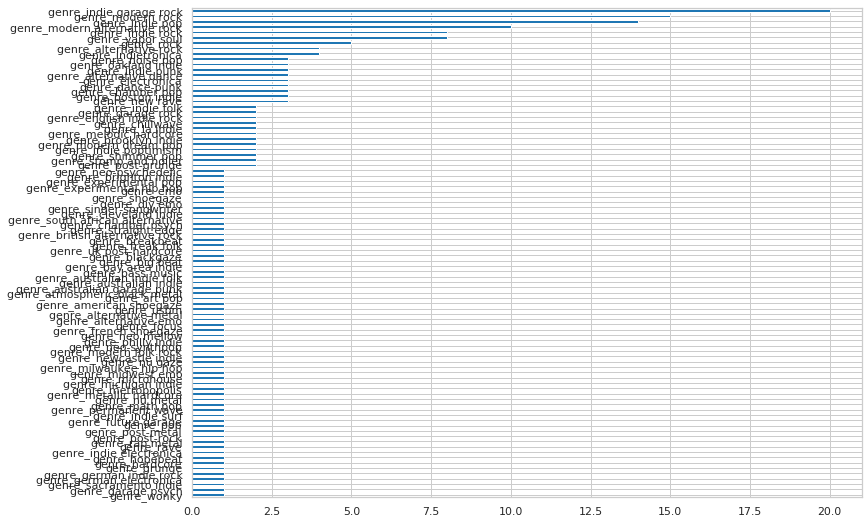

In [7]:
df_genre.sum().sort_values().plot(kind='barh')


 first I delete the genre which are not relevant, such as:
 * those from specific US states such as "brooklyn_indie"

In [8]:

df_genre = df_genre.loc[:,~df_genre.columns.str.contains(r'genre_\w+ indie')]


In [9]:
# To analyse genre combination I use the Yule distance (https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.yule.html) which is a binary array disambleance distance.
# It uses the amount of time a True is encountered at the same index for both arrays


<Figure size 864x648 with 0 Axes>

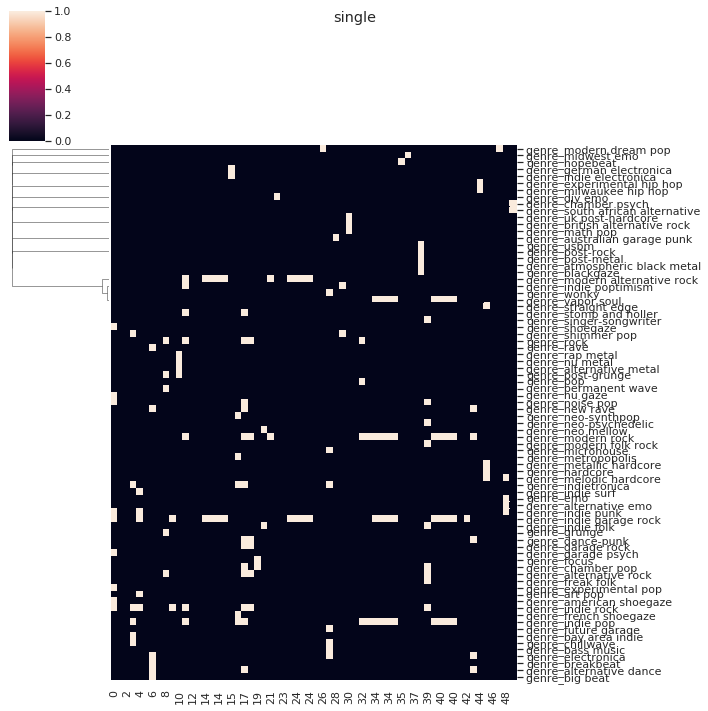

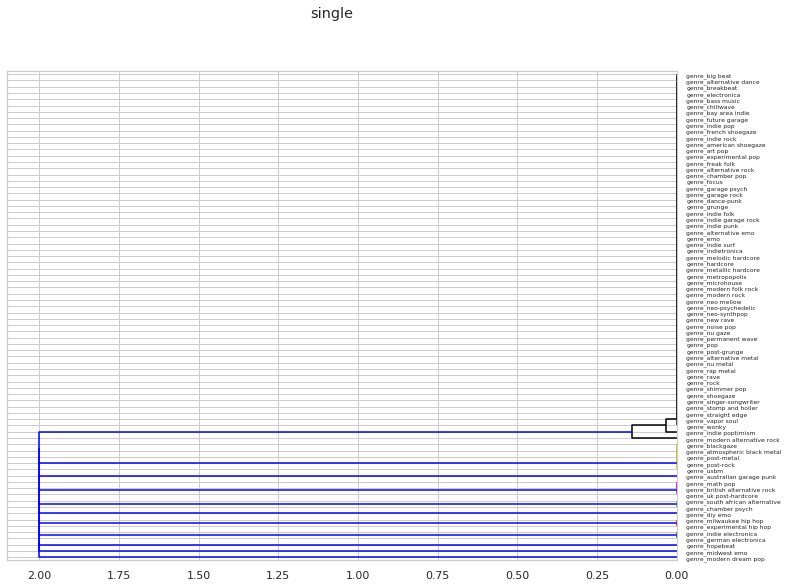

<Figure size 864x648 with 0 Axes>

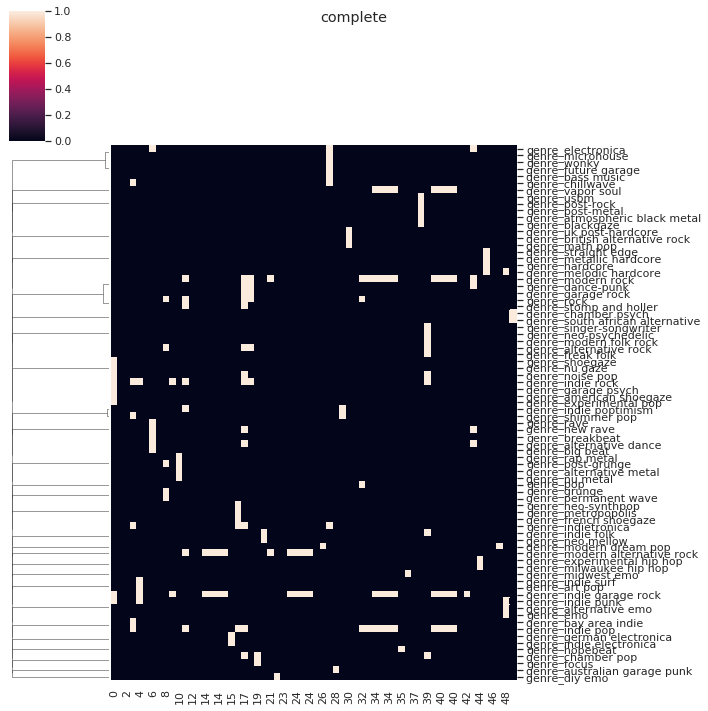

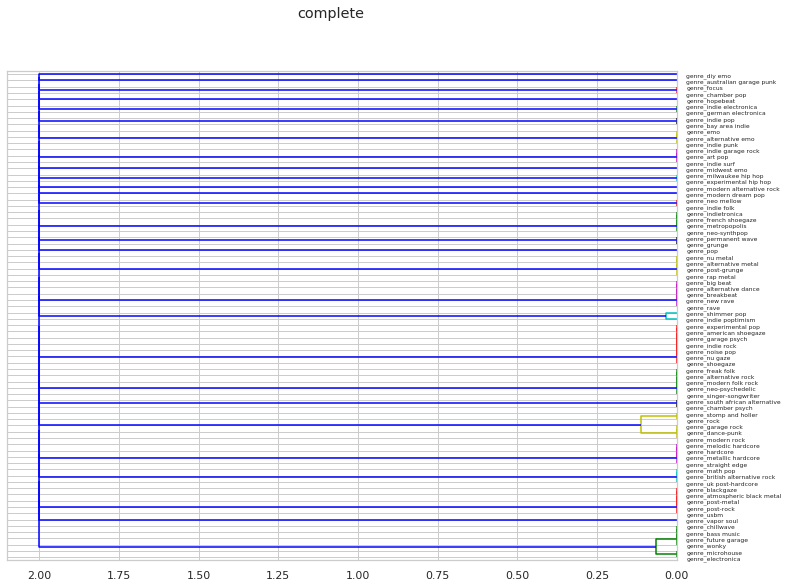

<Figure size 864x648 with 0 Axes>

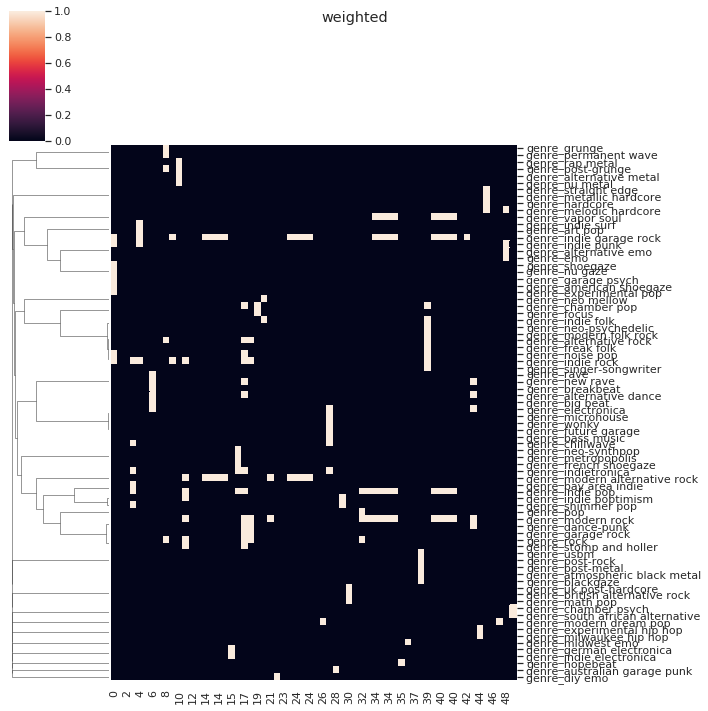

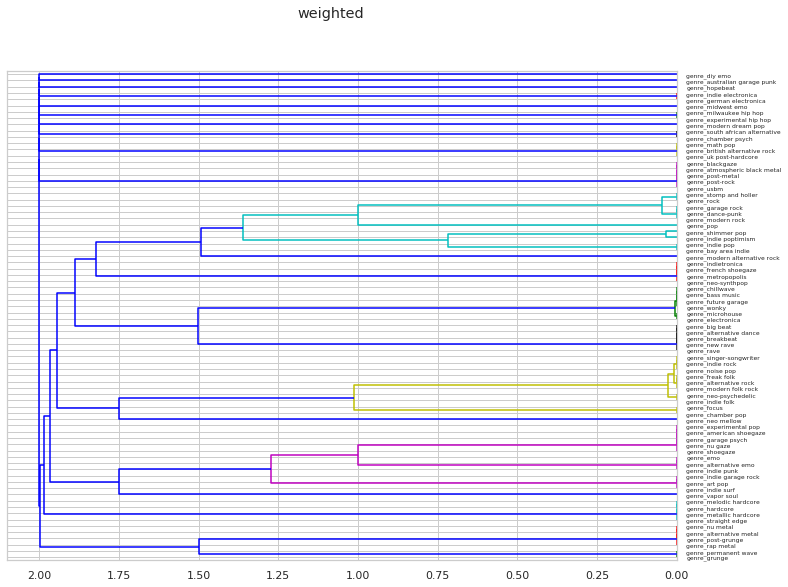

<Figure size 864x648 with 0 Axes>

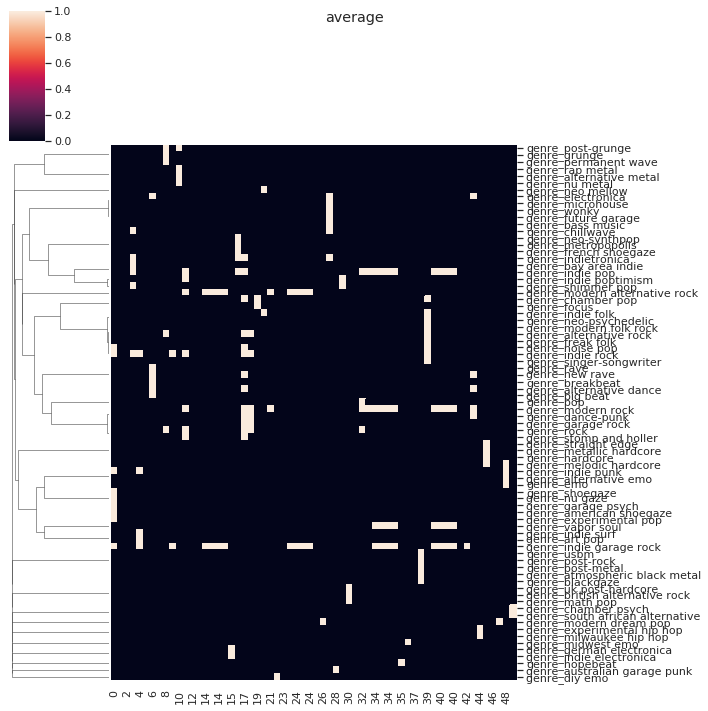

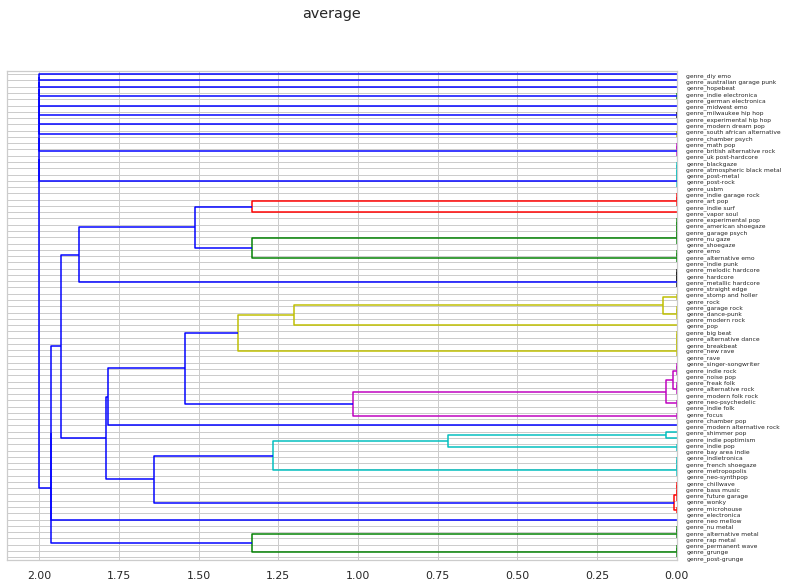

In [11]:
from scipy.cluster.hierarchy import fcluster, dendrogram, linkage
import matplotlib.pyplot as plt
from scipy.spatial.distance import yule

def plot_clusters(method:str, df_genre:pd.DataFrame=df_genre):
    plt.figure()
    g = sns.clustermap(df_genre.transpose(),
                        method=method,
                        metric='yule', 
                        col_cluster=False,
                        yticklabels=True)
    g.fig.suptitle(method) 

    L = g.dendrogram_row.linkage

    plt.figure().suptitle(method)
    _ = dendrogram(L,
                    orientation='left',
                    labels=df_genre.columns.to_list())

    return L

L_single = plot_clusters('single')
L_complete = plot_clusters('complete')

L_weighted = plot_clusters('weighted')
L_average = plot_clusters('average')



 Now the idea is to retrieve the clusters made by Seaborn to simplify the
 genres in bigger groups/clusters and as such reduce the number of genre to
 less than 10 and as such reduce the number of combined genre. Such
 super-genres could be:
 * electronic
 * alt. rock pop
 * rock
 * other

In [12]:

from IPython.display import display

def get_cluster(Z, t, df_genre=df_genre)->pd.DataFrame:
    cl = fcluster(Z, t, criterion='distance')

    df_genre_cluster:pd.DataFrame = df_genre.columns.to_frame()\
                                            .reset_index(drop=True)\
                                            .assign(cluster=cl)\
                                            .pivot(columns='cluster')

    # reduce row size, only need a dropping list of genres
    df_genre_cluster = df_genre_cluster.apply(
        lambda x: x.sort_values().reset_index(drop=True)
    )
    df_genre_cluster = df_genre_cluster.dropna(how='all')

    # # delete cluster of size 1
    # df_genre_cluster = df_genre_cluster.dropna(axis=1, thresh=2)

    return df_genre_cluster

def display_cluster(Z, t, method:str, df_genre=df_genre):
    with pd.option_context('display.max_rows', None):
        print(f'{method} - {t}')
        display(get_cluster(Z, t))


In [13]:
display_cluster(L_weighted, 1.4, 'weighted')


weighted - 1.4


0                           \
cluster                    1                        2    
0                genre_grunge  genre_alternative metal   
1        genre_permanent wave           genre_nu metal   
2                         NaN        genre_post-grunge   
3                         NaN          genre_rap metal   
4                         NaN                      NaN   
5                         NaN                      NaN   
6                         NaN                      NaN   
7                         NaN                      NaN   
8                         NaN                      NaN   
9                         NaN                      NaN   
10                        NaN                      NaN   

                                                                             \
cluster                       3                        4                 5    
0                 genre_hardcore    genre_alternative emo  genre_vapor soul   
1         genre_melodic hardcore  genre_american shoegaze               NaN   
2        genre_metallic hardcore            genre_art pop               NaN   
3            genre_straight edge                genre_emo               NaN   
4                            NaN   genre_experimental pop               NaN   
5                            NaN       genre_garage psych               NaN   
6                            NaN  genre_indie garage rock               NaN   
7                            NaN         genre_indie punk               NaN   
8                            NaN         genre_indie surf               NaN   
9                            NaN            genre_nu gaze               NaN   
10                           NaN           genre_shoegaze               NaN   

                                                                             \
cluster                       6                 7                        8    
0         genre_alternative rock  genre_neo mellow  genre_alternative dance   
1              genre_chamber pop               NaN           genre_big beat   
2                    genre_focus               NaN          genre_breakbeat   
3               genre_freak folk               NaN           genre_new rave   
4               genre_indie folk               NaN               genre_rave   
5               genre_indie rock               NaN                      NaN   
6         genre_modern folk rock               NaN                      NaN   
7          genre_neo-psychedelic               NaN                      NaN   
8                genre_noise pop               NaN                      NaN   
9        genre_singer-songwriter               NaN                      NaN   
10                           NaN               NaN                      NaN   

                                                                             \
cluster                   9                      10                      11   
0           genre_bass music  genre_french shoegaze    genre_bay area indie   
1            genre_chillwave     genre_indietronica        genre_dance-punk   
2          genre_electronica     genre_metropopolis       genre_garage rock   
3        genre_future garage     genre_neo-synthpop         genre_indie pop   
4           genre_microhouse                    NaN   genre_indie poptimism   
5                genre_wonky                    NaN       genre_modern rock   
6                        NaN                    NaN               genre_pop   
7                        NaN                    NaN              genre_rock   
8                        NaN                    NaN       genre_shimmer pop   
9                        NaN                    NaN  genre_stomp and holler   
10                       NaN                    NaN                     NaN   

                                                                       \
cluster                             12                             13   
0        genre_modern alternative rock  gen

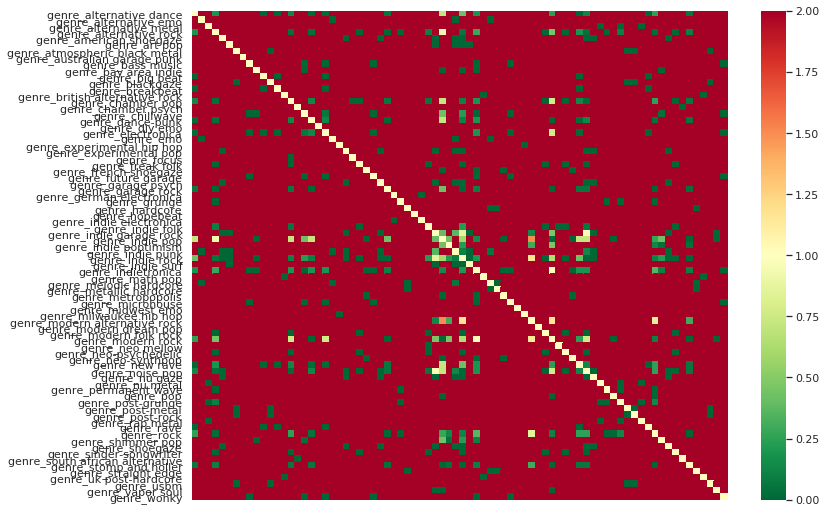

In [16]:
from scipy.spatial.distance import yule
sns.heatmap(df_genre.corr(method=yule),
            cmap='RdYlGn_r',
            xticklabels=False,
            yticklabels=True)


In [35]:

from IPython.display import display

def get_cluster_df(cl, df_genre=df_genre)->pd.DataFrame:
    df_genre_cluster:pd.DataFrame = df_genre.columns.to_frame()\
                                            .reset_index(drop=True)\
                                            .assign(cluster=cl)\
                                            .pivot(columns='cluster')

    # reduce row size, only need a dropping list of genres
    df_genre_cluster = df_genre_cluster.apply(
        lambda x: x.sort_values().reset_index(drop=True)
    )
    df_genre_cluster = df_genre_cluster.dropna(how='all')

    # # delete cluster of size 1
    # df_genre_cluster = df_genre_cluster.dropna(axis=1, thresh=2)

    return df_genre_cluster

def get_cluster_from_linkage(Z, t, df_genre=df_genre)->pd.DataFrame:
    cl = fcluster(Z, t, criterion='distance')
    return get_cluster_df(cl, df_genre=df_genre)

def display_cluster_from_linkage(Z, t, method:str, df_genre=df_genre):
    with pd.option_context('display.max_rows', None):
        print(f'{method} - {t}')
        display(get_cluster_from_linkage(Z, t))

def display_cluster(cl, method:str, df_genre=df_genre):
    with pd.option_context('display.max_rows', None):
        print(method)
        display(get_cluster_df(cl))


 Missing:
 * give name to super-genre
 * transform the genres into an unique super-genre (which to chose ??)
 * Maybe there is a better algorithm to define the clusters and the minimum list of super-genres to only have 1 super-genres per row...
 test this
 test DBSCAN (maybe better ?)

In [73]:

from sklearn.cluster import OPTICS

cl = OPTICS(
    max_eps=1,
    min_samples=2,# to avoid lonely genre, goal is to have super-genre
    metric='yule',
    cluster_method='dbscan',
    algorithm='brute',# only valid algorithm for this metric
    n_jobs=-2
)
cl_optics = cl.fit_predict(df_genre.transpose())

display_cluster(cl_optics, method='dbscan')


dbscan


0                                 \
cluster                            -1                              0   
0        genre_australian garage punk        genre_alternative dance   
1                       genre_diy emo          genre_alternative emo   
2                      genre_hopebeat        genre_alternative metal   
3                   genre_midwest emo         genre_alternative rock   
4              genre_modern dream pop        genre_american shoegaze   
5                                 NaN                  genre_art pop   
6                                 NaN               genre_bass music   
7                                 NaN           genre_bay area indie   
8                                 NaN                 genre_big beat   
9                                 NaN                genre_breakbeat   
10                                NaN              genre_chamber pop   
11                                NaN                genre_chillwave   
12                                NaN               genre_dance-punk   
13                                NaN              genre_electronica   
14                                NaN                      genre_emo   
15                                NaN         genre_experimental pop   
16                                NaN                    genre_focus   
17                                NaN               genre_freak folk   
18                                NaN          genre_french shoegaze   
19                                NaN            genre_future garage   
20                                NaN             genre_garage psych   
21                                NaN              genre_garage rock   
22                                NaN                   genre_grunge   
23                                NaN                 genre_hardcore   
24                                NaN               genre_indie folk   
25                                NaN        genre_indie garage rock   
26                                NaN                genre_indie pop   
27                                NaN          genre_indie poptimism   
28                                NaN               genre_indie punk   
29                                NaN               genre_indie rock   
30                                NaN               genre_indie surf   
31                                NaN             genre_indietronica   
32                                NaN         genre_melodic hardcore   
33                                NaN        genre_metallic hardcore   
34                                NaN             genre_metropopolis   
35                                NaN               genre_microhouse   
36                                NaN  genre_modern alternative rock   
37                                NaN         genre_modern folk rock   
38                                NaN              genre_modern rock   
39                                NaN               genre_neo mellow   
40                                NaN          genre_neo-psychedelic   
41                                NaN             genre_neo-synthpop   
42                                NaN                 genre_new rave   
43                                NaN                genre_noise pop   
44                                NaN                  genre_nu gaze   
45                                NaN                 genre_nu metal   
46                                NaN           genre_permanent wave   
47                                NaN                      genre_pop   
48                                NaN              genre_post-grunge   
49                                NaN                genre_rap metal   
50                                NaN                     genre_rave   
51                                NaN                     genre_rock   
52                                NaN              genre_shimmer pop   
53                                NaN                 genre_shoegaze   
54  

In [74]:

from scipy.cluster.hierarchy import cut_tree, leaders

display(fcluster(L_weighted, 1.99, criterion='distance'))
display(leaders(L_weighted, fcluster(L_weighted, 1.99, criterion='distance')))


array([2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 1, 1, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2], dtype=int32)

(array([107, 115], dtype=int32), array([1, 2], dtype=int32))

 Proposal:
 * use OPTIC-DBSCAN to create initial clusters
 * cluster -1 become "other"
 * use hierarchy clustering to cluster the big cluster "0"
 * merge both super-genre clusters
 * re-apply on each sample/artist (one artist could have 2 super-genre...)
 * check and plot T-SNE as such

<Figure size 864x648 with 0 Axes>

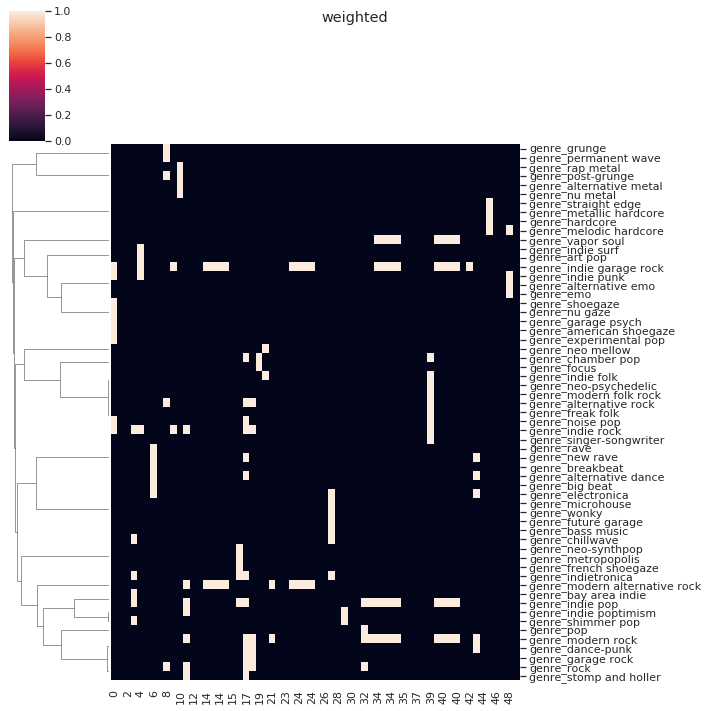

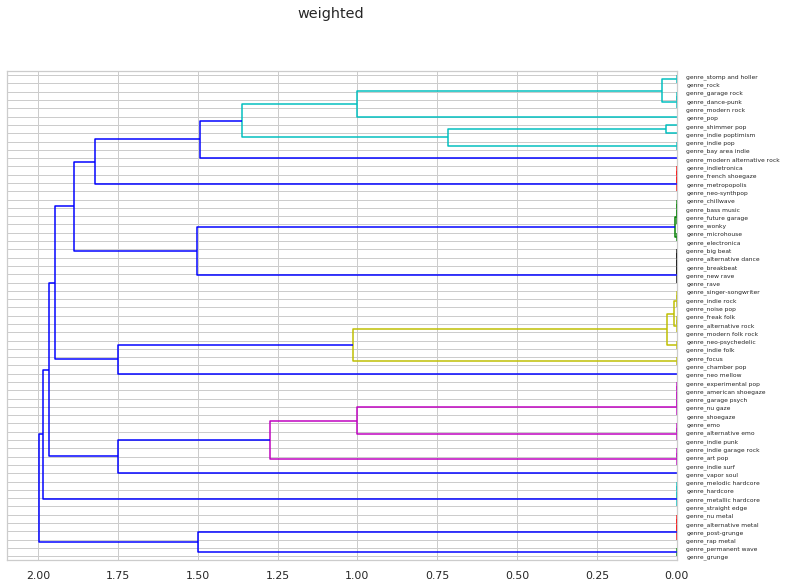

In [75]:

df_genre_cluster_optic = get_cluster_df(cl_optics)
genre_cluster_0 = df_genre_cluster_optic[0][0]

L_weighted2 = plot_clusters('weighted', df_genre=df_genre[genre_cluster_0])


In [78]:

from IPython.display import display

def get_cluster_df(cl, df_genre=df_genre)->pd.DataFrame:
    df_genre_cluster:pd.DataFrame = df_genre.columns.to_frame()\
                                            .reset_index(drop=True)\
                                            .assign(cluster=cl)\
                                            .pivot(columns='cluster')

    # reduce row size, only need a dropping list of genres
    df_genre_cluster = df_genre_cluster.apply(
        lambda x: x.sort_values().reset_index(drop=True)
    )
    df_genre_cluster = df_genre_cluster.dropna(how='all')

    # # delete cluster of size 1
    # df_genre_cluster = df_genre_cluster.dropna(axis=1, thresh=2)

    return df_genre_cluster

def get_cluster_from_linkage(Z, t, df_genre=df_genre)->pd.DataFrame:
    cl = fcluster(Z, t, criterion='distance')
    return get_cluster_df(cl, df_genre=df_genre)

def display_cluster_from_linkage(Z, t, method:str, df_genre=df_genre):
    with pd.option_context('display.max_rows', None):
        print(f'{method} - {t}')
        display(get_cluster_from_linkage(Z, t, df_genre=df_genre))

def display_cluster(cl, method:str, df_genre=df_genre):
    with pd.option_context('display.max_rows', None):
        print(method)
        display(get_cluster_df(cl, df_genre=df_genre))


In [79]:
display_cluster_from_linkage(
    L_weighted2,
    1.5,
    'weighted',
    df_genre=df_genre[genre_cluster_0]
)


weighted - 1.5


0                           \
cluster                       1                        2    
0        genre_alternative metal           genre_hardcore   
1                   genre_grunge   genre_melodic hardcore   
2                 genre_nu metal  genre_metallic hardcore   
3           genre_permanent wave      genre_straight edge   
4              genre_post-grunge                      NaN   
5                genre_rap metal                      NaN   
6                            NaN                      NaN   
7                            NaN                      NaN   
8                            NaN                      NaN   
9                            NaN                      NaN   
10                           NaN                      NaN   

                                                                             \
cluster                       3                 4                        5    
0          genre_alternative emo  genre_vapor soul   genre_alternative rock   
1        genre_american shoegaze               NaN        genre_chamber pop   
2                  genre_art pop               NaN              genre_focus   
3                      genre_emo               NaN         genre_freak folk   
4         genre_experimental pop               NaN         genre_indie folk   
5             genre_garage psych               NaN         genre_indie rock   
6        genre_indie garage rock               NaN   genre_modern folk rock   
7               genre_indie punk               NaN    genre_neo-psychedelic   
8               genre_indie surf               NaN          genre_noise pop   
9                  genre_nu gaze               NaN  genre_singer-songwriter   
10                genre_shoegaze               NaN                      NaN   

                                                                         \
cluster                6                        7                    8    
0        genre_neo mellow  genre_alternative dance     genre_bass music   
1                     NaN           genre_big beat      genre_chillwave   
2                     NaN          genre_breakbeat    genre_electronica   
3                     NaN           genre_new rave  genre_future garage   
4                     NaN               genre_rave     genre_microhouse   
5                     NaN                      NaN          genre_wonky   
6                     NaN                      NaN                  NaN   
7                     NaN                      NaN                  NaN   
8                     NaN                      NaN                  NaN   
9                     NaN                      NaN                  NaN   
10                    NaN                      NaN                  NaN   

                                                               
cluster                     9                              10  
0        genre_french shoegaze           genre_bay area indie  
1           genre_indietronica               genre_dance-punk  
2           genre_metropopolis              genre_garage rock  
3           genre_neo-synthpop                genre_indie pop  
4                          NaN          genre_indie poptimism  
5                          NaN  genre_modern alternative rock  
6                          NaN              genre_modern rock  
7                          NaN                      genre_pop  
8                          NaN                     genre_rock  
9                          NaN              genre_shimmer pop  
10                         NaN         genre_stomp and holler

weighted - 1.5


0                           \
cluster                       1                        2    
0        genre_alternative metal           genre_hardcore   
1                   genre_grunge   genre_melodic hardcore   
2                 genre_nu metal  genre_metallic hardcore   
3           genre_permanent wave      genre_straight edge   
4              genre_post-grunge                      NaN   
5                genre_rap metal                      NaN   
6                            NaN                      NaN   
7                            NaN                      NaN   
8                            NaN                      NaN   
9                            NaN                      NaN   
10                           NaN                      NaN   

                                                                             \
cluster                       3                 4                        5    
0          genre_alternative emo  genre_vapor soul   genre_alternative rock   
1        genre_american shoegaze               NaN        genre_chamber pop   
2                  genre_art pop               NaN              genre_focus   
3                      genre_emo               NaN         genre_freak folk   
4         genre_experimental pop               NaN         genre_indie folk   
5             genre_garage psych               NaN         genre_indie rock   
6        genre_indie garage rock               NaN   genre_modern folk rock   
7               genre_indie punk               NaN    genre_neo-psychedelic   
8               genre_indie surf               NaN          genre_noise pop   
9                  genre_nu gaze               NaN  genre_singer-songwriter   
10                genre_shoegaze               NaN                      NaN   

                                                                         \
cluster                6                        7                    8    
0        genre_neo mellow  genre_alternative dance     genre_bass music   
1                     NaN           genre_big beat      genre_chillwave   
2                     NaN          genre_breakbeat    genre_electronica   
3                     NaN           genre_new rave  genre_future garage   
4                     NaN               genre_rave     genre_microhouse   
5                     NaN                      NaN          genre_wonky   
6                     NaN                      NaN                  NaN   
7                     NaN                      NaN                  NaN   
8                     NaN                      NaN                  NaN   
9                     NaN                      NaN                  NaN   
10                    NaN                      NaN                  NaN   

                                                               \
cluster                     9                              10   
0        genre_french shoegaze           genre_bay area indie   
1           genre_indietronica               genre_dance-punk   
2           genre_metropopolis              genre_garage rock   
3           genre_neo-synthpop                genre_indie pop   
4                          NaN          genre_indie poptimism   
5                          NaN  genre_modern alternative rock   
6                          NaN              genre_modern rock   
7                          NaN                      genre_pop   
8                          NaN                     genre_rock   
9                          NaN              genre_shimmer pop   
10                         NaN         genre_stomp and holler   

                                                                        \
cluster                             11                              12   
0        genre_atmospheric black metal  genre_british alternative rock   
1                      genre_blackgaze                  genre_math pop   
2                     genre_post-metal          genre_uk post-hardcore   
3                

<Figure size 864x648 with 0 Axes>

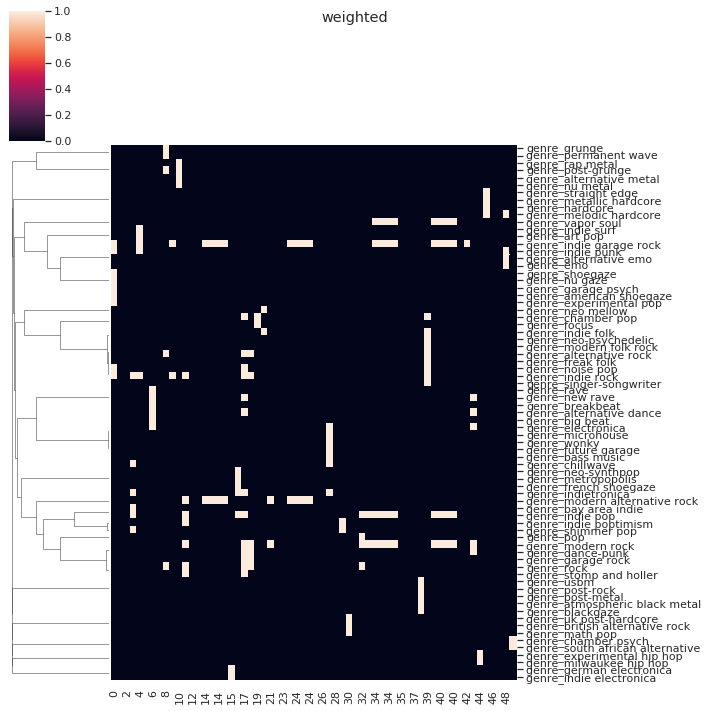

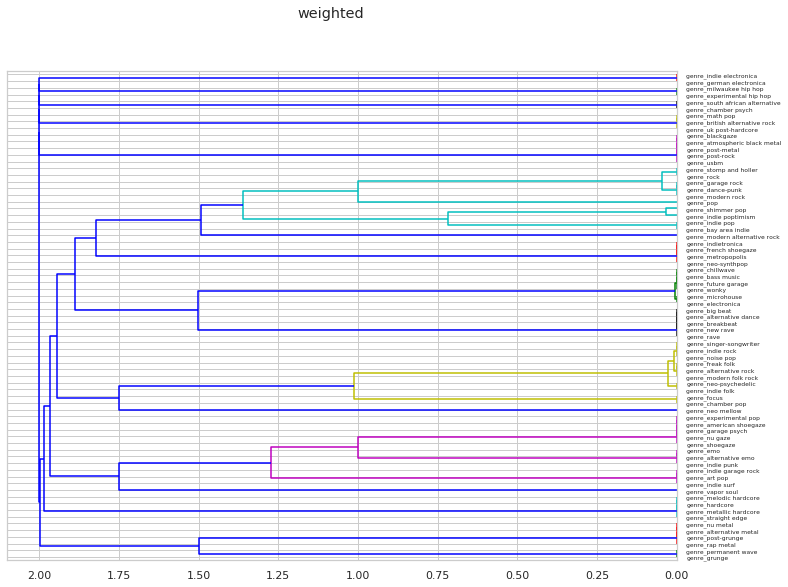

In [82]:

df_genre_cluster_optic = get_cluster_df(cl_optics)
# genre_cluster_0 = df_genre_cluster_optic[0][0]
genre_cluster_out = df_genre_cluster_optic[0][-1].dropna()

# df_genre2 = df_genre[genre_cluster_0]
df_genre2 = df_genre.drop(genre_cluster_out, axis=1)

L_weighted2 = plot_clusters('weighted', df_genre=df_genre2)

display_cluster_from_linkage(
    L_weighted2,
    1.5,
    'weighted',
    df_genre=df_genre2
)


 ok now that's not so bad, let's plot T-SNE (maybe too much genre but will be
 interesting with all the liked songs)

 So in the end, seems more robust to cluster everything out of the outlier
 (the small clusters are found again)

 Now time to wrap this up and plot T-SNE !

 And not forget to name the super-genre...

 Biggest issue will be to fit the legend with the plot (should be easy...)

In [93]:
genre_cluster_out.to_frame().rename_axis('cluster')


,-1
cluster,
0,genre_australian garage punk
1,genre_diy emo
2,genre_hopebeat
3,genre_midwest emo
4,genre_modern dream pop


In [96]:
df_genre_super


0                           \
cluster                       1                        2    
0        genre_alternative metal           genre_hardcore   
1                   genre_grunge   genre_melodic hardcore   
2                 genre_nu metal  genre_metallic hardcore   
3           genre_permanent wave      genre_straight edge   
4              genre_post-grunge                      NaN   
5                genre_rap metal                      NaN   
6                            NaN                      NaN   
7                            NaN                      NaN   
8                            NaN                      NaN   
9                            NaN                      NaN   
10                           NaN                      NaN   
11                           NaN                      NaN   

                                                           \
cluster                       3                        4    
0          genre_alternative emo   genre_alternative rock   
1        genre_american shoegaze        genre_chamber pop   
2                  genre_art pop              genre_focus   
3                      genre_emo         genre_freak folk   
4         genre_experimental pop         genre_indie folk   
5             genre_garage psych         genre_indie rock   
6        genre_indie garage rock   genre_modern folk rock   
7               genre_indie punk         genre_neo mellow   
8               genre_indie surf    genre_neo-psychedelic   
9                  genre_nu gaze          genre_noise pop   
10                genre_shoegaze  genre_singer-songwriter   
11              genre_vapor soul                      NaN   

                                                         \
cluster                       5                      6    
0        genre_alternative dance  genre_french shoegaze   
1               genre_bass music     genre_indietronica   
2                 genre_big beat     genre_metropopolis   
3                genre_breakbeat     genre_neo-synthpop   
4                genre_chillwave                    NaN   
5              genre_electronica                    NaN   
6            genre_future garage                    NaN   
7               genre_microhouse                    NaN   
8                 genre_new rave                    NaN   
9                     genre_rave                    NaN   
10                   genre_wonky                    NaN   
11                           NaN                    NaN   

                                                                       \
cluster                             7                              8    
0                 genre_bay area indie  genre_atmospheric black metal   
1                     genre_dance-punk                genre_blackgaze   
2                    genre_garage rock               genre_post-metal   
3                      genre_indie pop                genre_post-rock   
4                genre_indie poptimism                     genre_usbm   
5        genre_modern alternative rock                            NaN   
6                    genre_modern rock                            NaN   
7                            genre_pop                            NaN   
8                           genre_rock                            NaN   
9                    genre_shimmer pop                            NaN   
10              genre_stomp and holler                            NaN   
11                                 NaN                            NaN   

                                                                          \
cluster                              9                                10   
0        genre_british alternative rock              genre_chamber psych   
1                        genre_math pop  genre_south african alternative   
2                genre_uk post-hardcore                              NaN   
3                                   NaN                              NaN   
4              

In [97]:

df_genre_super = get_cluster_from_linkage(L_weighted2, 1.8, df_genre=df_genre2)

df_genre_super = df_genre_super[0].combine_first(
    genre_cluster_out.to_frame().rename_axis('cluster')
)


In [98]:
display(df_genre_super)


,-1,1,2,3,4,5,6,7,8,9,10,11,12
0,genre_australian garage punk,genre_alternative metal,genre_hardcore,genre_alternative emo,genre_alternative rock,genre_alternative dance,genre_french shoegaze,genre_bay area indie,genre_atmospheric black metal,genre_british alternative rock,genre_chamber psych,genre_experimental hip hop,genre_german electronica
1,genre_diy emo,genre_grunge,genre_melodic hardcore,genre_american shoegaze,genre_chamber pop,genre_bass music,genre_indietronica,genre_dance-punk,genre_blackgaze,genre_math pop,genre_south african alternative,genre_milwaukee hip hop,genre_indie electronica
2,genre_hopebeat,genre_nu metal,genre_metallic hardcore,genre_art pop,genre_focus,genre_big beat,genre_metropopolis,genre_garage rock,genre_post-metal,genre_uk post-hardcore,NaN,NaN,NaN
3,genre_midwest emo,genre_permanent wave,genre_straight edge,genre_emo,genre_freak folk,genre_breakbeat,genre_neo-synthpop,genre_indie pop,genre_post-rock,NaN,NaN,NaN,NaN
4,genre_modern dream pop,genre_post-grunge,NaN,genre_experimental pop,genre_indie folk,genre_chillwave,NaN,genre_indie poptimism,genre_usbm,NaN,NaN,NaN,NaN
5,NaN,genre_rap metal,NaN,genre_garage psych,genre_indie rock,genre_electronica,NaN,genre_modern alternative rock,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,NaN,genre_indie garage rock,genre_modern folk rock,genre_future garage,NaN,genre_modern rock,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,NaN,genre_indie punk,genre_neo mellow,genre_microhouse,NaN,genre_pop,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,NaN,genre_indie surf,genre_neo-psychedelic,genre_new rave,NaN,genre_rock,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,NaN,genre_nu gaze,genre_noise pop,genre_rave,NaN,genre_shimmer pop,NaN,NaN,NaN,NaN,NaN


In [121]:

import re
from itertools import chain
from collections import Counter
from statistics import mode

def split_word(x:str)->List[str]:
    """
    split a string as a list of words
    
    Arguments:
        x {str} -- string to split
    
    Returns:
        List[str] -- list of words (as strngs)
    """
    if x is np.nan:
        return []
    x = x.replace('genre_', '')
    return re.findall(r"[\w']+", x)

def robust_str_mode(x:List[str], sep:str='-')->str:
    """
    robust method to calculate the mode of a list of string, returns a concatenate string in case of equal number of counter
    
    Arguments:
        x {List[str]} -- list of string to calcualte the mode
        sep {str} -- string used to concatenate mutliple string in case of draw
    
    Returns:
        [str] -- mode word
    """
    try:
        return mode(x)
    except:
        vc = pd.Series(x).value_counts()
        x_to_join = vc.index[vc == vc.max()].values
        return '-'.join(x_to_join)

super_genre = df_genre_super\
    .applymap(lambda x: split_word(x))\
    .agg(lambda x: robust_str_mode(list(chain(*x.to_list()))))


In [122]:
super_genre


-1                                                   emo
 1                                                 metal
 2                                              hardcore
 3                                                 indie
 4                                             folk-rock
 5                                                  rave
 6     synthpop-metropopolis-shoegaze-neo-french-indi...
 7                                                  rock
 8                                            metal-post
 9     post-math-rock-hardcore-uk-alternative-british...
 10              psych-chamber-south-african-alternative
 11                                              hop-hip
 12                                          electronica
dtype: object